In [1]:
import rebound
import matplotlib.pyplot as plt
import numpy as np
from subprocess import call
%matplotlib inline

(-0.6, 0.44)

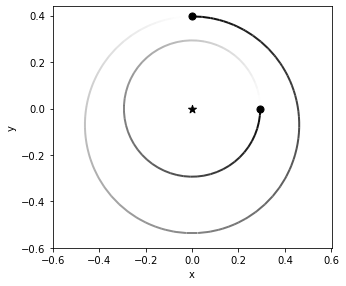

In [54]:
sim = rebound.Simulation()
sim.add(m=1)
sim.add(m=1e-5, P=1)
sim.add(m=1e-5, P=2.005, e=0.15, pomega=np.pi/2)
sim.move_to_com()
fig, ax = rebound.OrbitPlot(sim, lw=2)
ax.set_ylim([-0.6, 0.44])

In [55]:
Lmovie = 15 # sec
fps = 30
Norbits = 1000
times = np.linspace(0, Norbits, int(Lmovie*fps))
ps = sim.particles
Nout = 1000
phi = np.zeros(Nout)
times = np.linspace(0, Norbits, Nout)
for i, time in enumerate(times):
    sim.integrate(time)
    phi[i] = 2*ps[2].l - ps[1].l - ps[2].pomega

(-0.7, 0.55)

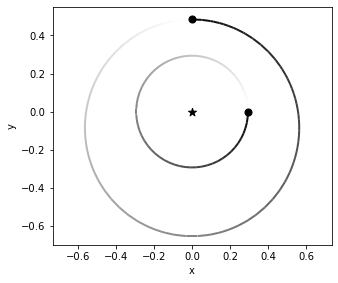

In [38]:
sim = rebound.Simulation()
sim.add(m=1)
sim.add(m=1e-5, P=1)
sim.add(m=1e-5, P=2.7, e=0.15, pomega=np.pi/2)
sim.move_to_com()
fig, ax = rebound.OrbitPlot(sim, lw=2)
ax.set_ylim([-0.7, 0.55])

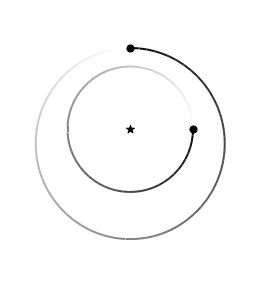

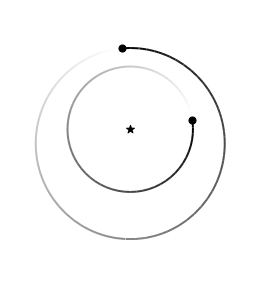

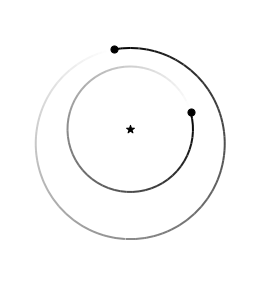

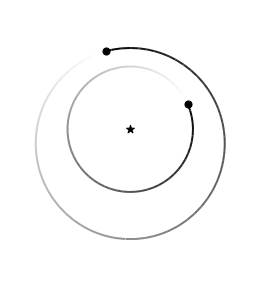

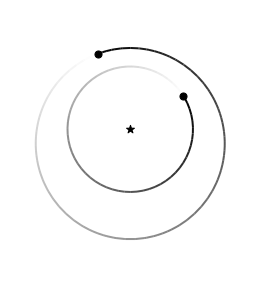

...

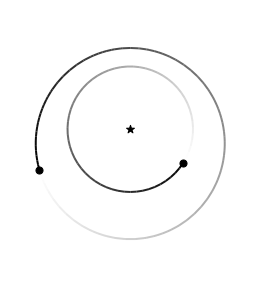

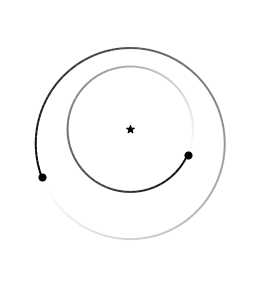

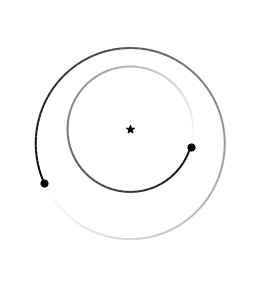

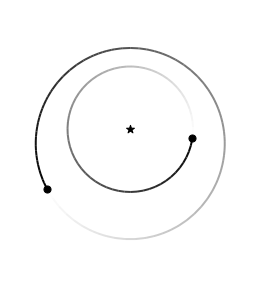

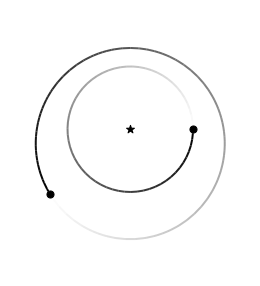

In [37]:
Lmovie = 15 # sec
fps = 30
Norbits = 10
times = np.linspace(0, Norbits, int(Lmovie*fps))
deltatheta = np.sin(sim.particles[1].theta - sim.particles[2].theta)
ps = sim.particles
for i, time in enumerate(times):
    sim.integrate(time)
    prevdeltatheta = deltatheta
    deltatheta = np.sin(ps[1].theta - ps[2].theta)
    
    fig, ax = rebound.OrbitPlot(sim, lw=2)
    ax.set_ylim([-0.7, 0.572])
    ax.axis('off')
    if prevdeltatheta < 0 and deltatheta > 0:
        ax.plot([0, ps[2].x*1.3], [0, ps[2].y*1.3], 'k', lw=5)
    fig.savefig('tmp/{0:0=5d}.png'.format(i), transparent=True, dpi=300, bbox_inches='tight')

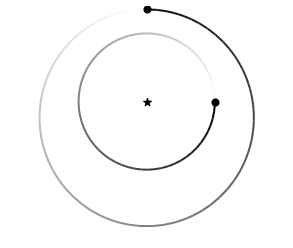

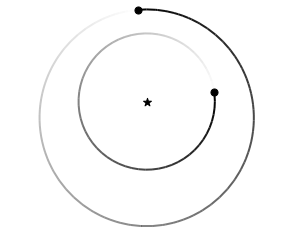

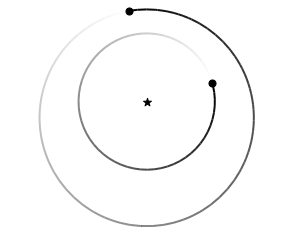

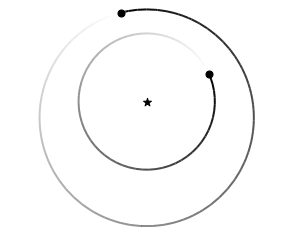

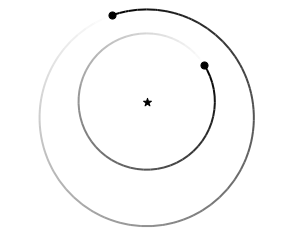

...

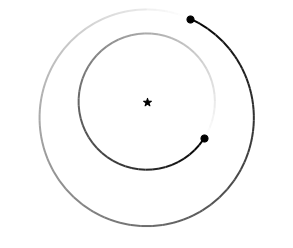

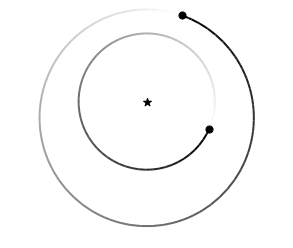

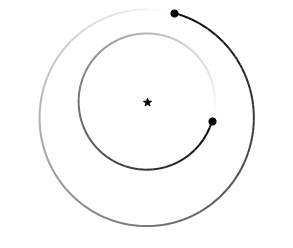

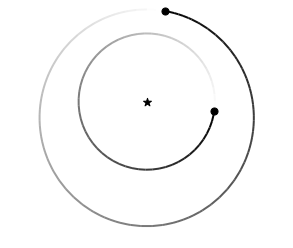

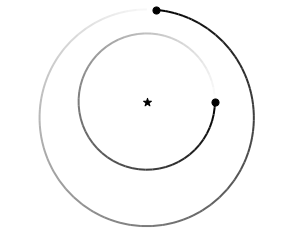

In [18]:
Lmovie = 15 # sec
fps = 30
Norbits = 10
times = np.linspace(0, Norbits, int(Lmovie*fps))
deltatheta = np.sin(sim.particles[1].theta - sim.particles[2].theta)
ps = sim.particles
for i, time in enumerate(times):
    sim.integrate(time)
    prevdeltatheta = deltatheta
    deltatheta = np.sin(ps[1].theta - ps[2].theta)
    
    fig, ax = rebound.OrbitPlot(sim, lw=2)
    ax.set_ylim([-0.6, 0.41])
    ax.axis('off')
    if prevdeltatheta < 0 and deltatheta > 0:
        ax.plot([0, ps[2].x*1.3], [0, ps[2].y*1.3], 'k', lw=5)
    fig.savefig('tmp/{0:0=5d}.png'.format(i), transparent=True, dpi=300, bbox_inches='tight')

(-0.6, 0.44)

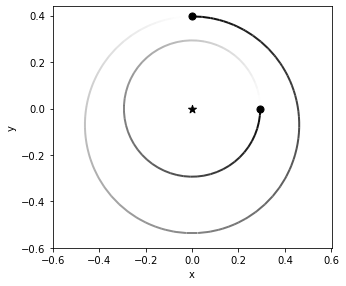

In [54]:
sim = rebound.Simulation()
sim.add(m=1)
sim.add(m=1e-5, P=1)
sim.add(m=1e-5, P=2.005, e=0.15, pomega=np.pi/2)
sim.move_to_com()
fig, ax = rebound.OrbitPlot(sim, lw=2)
ax.set_ylim([-0.6, 0.44])

(<Figure size 360x360 with 1 Axes>, <AxesSubplot:xlabel='x', ylabel='y'>)

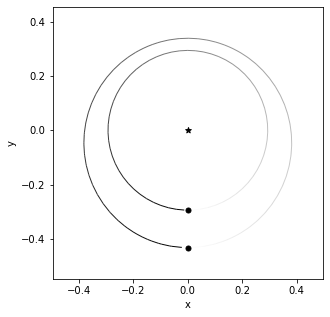

In [123]:
sim = rebound.Simulation()
sim.add(m=1)
sim.add(m=1e-4, P=1, l=np.pi/2)
sim.add(m=0, P=1.50, e=0.12, pomega=np.pi/2, l=-np.pi/2)
sim.move_to_com()
ps = sim.particles
sim.integrate(1.5)
sim.t = 0
sim.save('equilibrium.bin')
rebound.OrbitPlot(sim)

In [36]:
def write_png(params):
    i, time, filename, dpi = params
    sim = rebound.Simulation(filename)
    sim.integrate(time, exact_finish_time=0)
    ps = sim.particles
    fig, ax = plt.subplots(figsize=(8,8))#rebound.OrbitPlot(sim, lw=2)
    Nout = 1000
    fs = np.linspace(0, 2*np.pi, Nout)
    for p in ps[1:]:
        rs = np.zeros(Nout)
        for j, f in enumerate(fs):
            rs[j] = p.a*(1-p.e**2)/(1+p.e*np.cos(f))
        ax.plot(rs*np.cos(fs+np.pi/2), rs*np.sin(fs+np.pi/2), 'k', lw=3)

    
    r = ps[1].a
    ax.scatter(r*np.cos(ps[1].theta), r*np.sin(ps[1].theta), facecolor='k', s=100, zorder=3)
    r = ps[2].a*(1-ps[2].e**2)/(1+ps[2].e*np.cos(ps[2].f))
    ax.scatter(r*np.cos(ps[2].f+np.pi/2), r*np.sin(ps[2].f+np.pi/2), facecolor='k', s=100, zorder=3)

    deltar = np.sqrt((ps[1].x-ps[2].x)**2 + (ps[1].y-ps[2].y)**2)
    if np.abs(np.sin(ps[1].theta-ps[2].theta)) < 0.1 and deltar < ps[2].a:
        ax.plot([0, 1.3*r*np.cos(p.f+np.pi/2)], [0, 1.3*r*np.sin(p.f+np.pi/2)], 'k', lw=5)

    phi = np.mod(3*ps[2].l - 2*ps[1].l - ps[2].pomega, 2*np.pi)
    r = ps[2].a*(1-ps[2].e**2)/(1+ps[2].e*np.cos(phi))
    ax.scatter(0, 0, s=400, marker='*', facecolor='yellow', edgecolor='k', zorder=3)
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_xlim([-0.42, 0.42])
    ax.set_ylim([-0.46, 0.46])
    ax.text(-0.22, 0.4, 'Time = {0} years'.format(int(sim.t)), fontsize=32)

    fig.savefig('tmp/{0:0=5d}.png'.format(i), transparent=True, dpi=dpi, bbox_inches='tight')
    plt.close(fig)  

# Have to adjust DPI in 0.1 increments if ffmpeg complains about odd image sizes

In [38]:
%%time
dpi=300.4
filename = 'equilibrium.bin'
Lmovie = 45 # sec
fps = 30
Norbits = 30
times = np.linspace(0, Norbits, int(Lmovie*fps))

call("rm -f tmp/*.png", shell=True)
pool = rebound.InterruptiblePool()
params = [(i, time, filename, dpi) for i, time in enumerate(times)]
res = pool.map(write_png, params)

findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: cm
findfont: Generic family 'serif' not fo

CPU times: user 855 ms, sys: 752 ms, total: 1.61 s
Wall time: 1min 20s


(<Figure size 360x360 with 1 Axes>, <AxesSubplot:xlabel='x', ylabel='y'>)

findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: cm


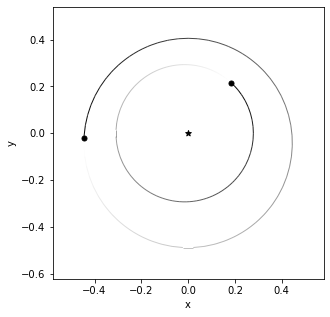

In [2]:
sim = rebound.Simulation()
sim.add(m=1)
sim.add(m=1e-4, P=1, e=0.05, l=np.pi/4)
sim.add(m=1e-4, P=1.88, e=0.093, pomega=np.pi/2, l=3)
sim.move_to_com()
ps = sim.particles
sim.t = 0
sim.save('randomconjunctions.bin')
rebound.OrbitPlot(sim)

In [3]:
def write_png(params):
    i, time, filename, dpi = params
    sim = rebound.Simulation(filename)
    sim.integrate(time, exact_finish_time=0)
    ps = sim.particles
    fig, ax = plt.subplots(figsize=(8,8))#rebound.OrbitPlot(sim, lw=2)
    Nout = 1000
    fs = np.linspace(0, 2*np.pi, Nout)
    for p in ps[1:]:
        rs = np.zeros(Nout)
        for j, f in enumerate(fs):
            rs[j] = p.a*(1-p.e**2)/(1+p.e*np.cos(f))
        ax.plot(rs*np.cos(fs+np.pi/2), rs*np.sin(fs+np.pi/2), 'k', lw=3)

    
    r = ps[1].a
    ax.scatter(r*np.cos(ps[1].theta), r*np.sin(ps[1].theta), facecolor='k', s=100, zorder=3)
    r = ps[2].a*(1-ps[2].e**2)/(1+ps[2].e*np.cos(ps[2].f))
    ax.scatter(r*np.cos(ps[2].f+np.pi/2), r*np.sin(ps[2].f+np.pi/2), facecolor='k', s=100, zorder=3)

    deltar = np.sqrt((ps[1].x-ps[2].x)**2 + (ps[1].y-ps[2].y)**2)
    if np.abs(np.sin(ps[1].theta-ps[2].theta)) < 0.1 and deltar < ps[2].a:
        ax.plot([0, 1.3*r*np.cos(p.f+np.pi/2)], [0, 1.3*r*np.sin(p.f+np.pi/2)], 'k', lw=5)

    phi = np.mod(3*ps[2].l - 2*ps[1].l - ps[2].pomega, 2*np.pi)
    r = ps[2].a*(1-ps[2].e**2)/(1+ps[2].e*np.cos(phi))
    ax.scatter(0, 0, s=400, marker='*', facecolor='yellow', edgecolor='k', zorder=3)
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_xlim([-0.5, 0.5])
    ax.set_ylim([-0.55, 0.56])
    ax.text(-0.26, 0.45, 'Time = {0} years'.format(int(sim.t)), fontsize=32)
    
    fig.savefig('tmp/{0:0=5d}.png'.format(i), transparent=True, dpi=dpi, bbox_inches='tight')
    plt.close(fig)  

In [7]:
%%time
dpi = 300.1
filename = 'randomconjunctions.bin'
Lmovie = 1 # sec
fps = 30
Norbits = 40
times = np.linspace(0, Norbits, int(Lmovie*fps))

call("rm -f tmp/*.png", shell=True)
pool = rebound.InterruptiblePool()
params = [(i, time, filename, dpi) for i, time in enumerate(times)]
res = pool.map(write_png, params)

findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: cm
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: cm
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: cm
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: cm
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: cm
findfont: G

CPU times: user 32.4 ms, sys: 41.9 ms, total: 74.3 ms
Wall time: 1.68 s


In [6]:
def write_png(params):
    i, time, filename, dpi = params
    sim = rebound.Simulation(filename)
    sim.t = 0
    sim.dt = 0.08*sim.particles[1].P
    sim.integrate(time*sim.particles[1].P, exact_finish_time=0)
    fig, ax = plt.subplots(figsize=(8,8))
    ax.set_xlim([-0.5, 0.5])
    ax.set_ylim([-0.5, 0.5])

    for p in sim.particles[1:]:
        o = np.array(p.sample_orbit())
        ax.plot(o[:,0], o[:,1], 'k', lw=2)
        ax.plot([o[:,0][-1], o[:,0][0]], [o[:,1][-1], o[:,1][0]], 'k', lw=2)
    ax.text(-0.45, 0.5, 'Time = {0:0=5d} years'.format(int(time)), fontsize=40)
    ax.axis('off')
    ax.scatter(0, 0, s=400, marker='*', facecolor='yellow', edgecolor='k', zorder=3)
    ax.set_aspect('equal')
    fig.savefig('tmp/{0:0=5d}.png'.format(i), transparent=True, dpi=dpi, bbox_inches='tight')
    plt.close(fig)  

In [8]:
%%time
dpi = 300.1
filename = 'randomconjunctions.bin'
Lmovie = 20 # sec
fps = 30
Norbits = 100000
times = np.linspace(0, Norbits, int(Lmovie*fps))

call("rm -f tmp/*.png", shell=True)
pool = rebound.InterruptiblePool()
params = [(i, time, filename, dpi) for i, time in enumerate(times)]
res = pool.map(write_png, params)

findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: cm
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: cm
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: cm
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: cm
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: cm
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families w

CPU times: user 4.97 s, sys: 1.77 s, total: 6.74 s
Wall time: 49min 8s
